In [14]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
from astropy.io import fits
from astropy.stats import sigma_clipped_stats

In [9]:
workingdir = '/Users/lockepatton/Desktop/2020-ASTR100/Data/OurRun'
!ls $workingdir

0001.BIAS.fits              0122.rxj0806.3+1527.fits
0002.BIAS.fits              0123.rxj0806.3+1527.fits
0003.BIAS.fits              0124.rxj0806.3+1527.fits
0004.BIAS.fits              0125.rxj0806.3+1527.fits
0005.BIAS.fits              0126.rxj0806.3+1527.fits
0006.BIAS.fits              0127.rxj0806.3+1527.fits
0007.BIAS.fits              0128.rxj0806.3+1527.fits
0008.BIAS.fits              0129.rxj0806.3+1527.fits
0009.BIAS.fits              0130.rxj0806.3+1527.fits
0010.BIAS.fits              0131.rxj0806.3+1527.fits
0011.BIAS.fits              0132.rxj0806.3+1527.fits
0012.BIAS.fits              0133.rxj0806.3+1527.fits
0013.BIAS.fits              0134.rxj0806.3+1527.fits
0014.BIAS.fits              0135.rxj0806.3+1527.fits
0015.BIAS.fits              0136.rxj0806.3+1527.fits
0016.BIAS.fits              0137.rxj0806.3+1527.fits
0017.FLATB.fits             0138.rxj0806.3+1527.fits
0018.FLATB.fits             0139.rxj0806.3+1527.fits
0019.FLATB.fits             0140.rxj0806.3+152

In [10]:
os.chdir(workingdir)

In [12]:
files_all = glob.glob('*fits')
files_BIAS = glob.glob('*BIAS*')
files_FLATS = glob.glob('*FLAT*')
files_ARCS = glob.glob('*COMP*')
files_TEST = glob.glob('*test*')

print(files_BIAS, '\n')
print(files_FLATS, '\n')
print(files_ARCS, '\n')
files_SCI = list(set(files_all)-set(files_BIAS)-set(files_FLATS)-set(files_ARCS)-set(files_TEST))
print(files_SCI)

['0016.BIAS.fits', '0002.BIAS.fits', '0009.BIAS.fits', '0010.BIAS.fits', '0004.BIAS.fits', '0003.BIAS.fits', '0008.BIAS.fits', '0005.BIAS.fits', '0011.BIAS.fits', '0014.BIAS.fits', '0012.BIAS.fits', '0006.BIAS.fits', '0001.BIAS.fits', '0015.BIAS.fits', '0007.BIAS.fits', '0013.BIAS.fits'] 

['0041.FLATr.fits', '0022.FLATB.fits', '0056.FLATi.fits', '0036.FLATV.fits', '0018.FLATB.fits', '0033.FLATV.fits', '0053.FLATi.fits', '0049.FLATr.fits', '0044.FLATr.fits', '0027.FLATB.fits', '0020.FLATB.fits', '0017.FLATB.fits', '0043.FLATr.fits', '0059.FLATi.fits', '0028.FLATV.fits', '0054.FLATi.fits', '0034.FLATV.fits', '0031.FLATV.fits', '0051.FLATi.fits', '0025.FLATB.fits', '0046.FLATr.fits', '0052.FLATi.fits', '0048.FLATr.fits', '0032.FLATV.fits', '0045.FLATr.fits', '0026.FLATB.fits', '0040.FLATr.fits', '0023.FLATB.fits', '0037.FLATV.fits', '0057.FLATi.fits', '0060.FLATi.fits', '0019.FLATB.fits', '0050.FLATi.fits', '0030.FLATV.fits', '0024.FLATB.fits', '0039.FLATr.fits', '0047.FLATr.fits', '0021

In [50]:
def readFits(filename):
    HDUList = fits.open(filename)
    headers = [HDUList[0].header, HDUList[1].header, HDUList[2].header, HDUList[3].header, HDUList[4].header]

    nx, ny = 1024, 1024
    StitchedData = np.zeros((2*nx, 2*ny))
    StitchedData[nx:nx*2,0:ny] = HDUList[2].data[:-1,8:-8]
    StitchedData[0:nx,0:ny] = HDUList[4].data[:-1,8:-8]
    StitchedData[nx:nx*2,ny:ny*2] = HDUList[1].data[:-1,8:-8]
    StitchedData[0:nx,ny:ny*2] = HDUList[3].data[:-1,8:-8]

    return HDUList, headers, StitchedData

In [125]:
BiasData = np.zeros((2*nx, 2*ny, len(files_BIAS)))

for i,file in enumerate(files_BIAS):
    HDUList, headers, StitchedData = readFits(file)
    BiasData[:,:,i] = StitchedData

In [126]:
BiasData

array([[[302., 301., 301., ..., 298., 298., 300.],
        [306., 304., 300., ..., 304., 303., 304.],
        [310., 307., 307., ..., 305., 308., 305.],
        ...,
        [306., 308., 306., ..., 309., 306., 306.],
        [303., 303., 304., ..., 302., 305., 304.],
        [300., 298., 298., ..., 300., 300., 299.]],

       [[295., 298., 299., ..., 301., 296., 294.],
        [303., 307., 302., ..., 303., 307., 300.],
        [309., 309., 307., ..., 302., 303., 307.],
        ...,
        [308., 308., 308., ..., 308., 306., 304.],
        [304., 304., 302., ..., 302., 306., 304.],
        [301., 298., 299., ..., 298., 296., 298.]],

       [[300., 303., 300., ..., 297., 299., 301.],
        [303., 306., 303., ..., 303., 302., 300.],
        [305., 308., 306., ..., 307., 306., 307.],
        ...,
        [305., 308., 306., ..., 305., 306., 310.],
        [303., 302., 303., ..., 305., 305., 304.],
        [298., 300., 297., ..., 296., 298., 299.]],

       ...,

       [[302., 308., 305

(array([1., 2., 2., 3., 0., 3., 3., 1., 0., 1.]),
 array([290. , 290.8, 291.6, 292.4, 293.2, 294. , 294.8, 295.6, 296.4,
        297.2, 298. ]),
 <a list of 10 Patch objects>)

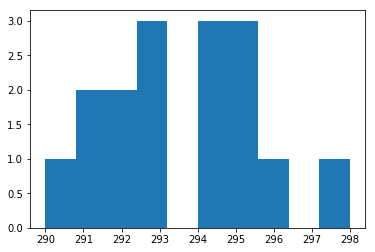

In [128]:
plt.hist(BiasData[40,40,:])

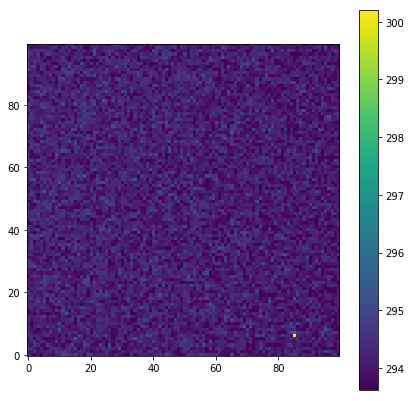

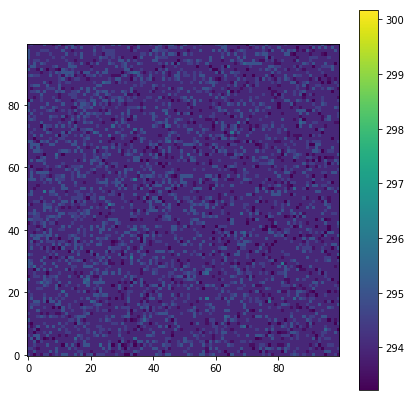

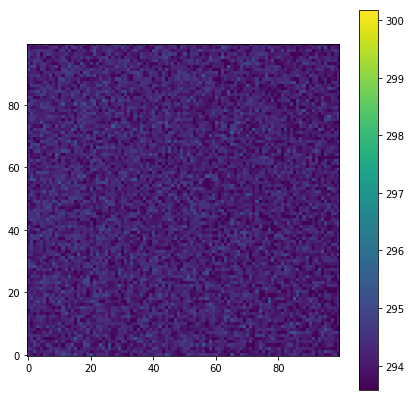

In [143]:
masterBias_mean = np.mean(BiasData, axis=2)
masterBias_med = np.median(BiasData, axis=2)

bias_max = np.max(BiasData, axis=2)
bias_min = np.min(BiasData, axis=2)
masterBias = (np.sum(BiasData, axis=2) - bias_min - bias_max)/(len(files_BIAS)-2)

center = [1250, 1800]

def plotit(data, dx=50):
    mean, median, std = sigma_clipped_stats(data)
    plt.figure(figsize=(7,7))
    plt.imshow(data[center[0]-dx:center[0]+dx,center[1]-dx:center[1]+dx],
               vmin = median - 2*std, vmax = median + 3*std, origin='lower')
    plt.colorbar()
    plt.show()

plotit(masterBias_mean)
plotit(masterBias_med)
plotit(masterBias)

[[360 334 345 ... 344 344 351]
 [364 344 347 ... 347 344 349]
 [356 346 338 ... 345 340 343]
 ...
 [321 317 325 ... 341 345 340]
 [314 313 318 ... 342 341 340]
 [308 312 316 ... 335 341 341]]
[[323 330 330 ... 344 338 345]
 [322 328 330 ... 344 345 346]
 [323 329 336 ... 349 341 342]
 ...
 [364 332 343 ... 348 359 355]
 [353 328 336 ... 349 355 348]
 [301 310 312 ... 301 303 304]]
[[346 342 339 ... 346 348 440]
 [344 346 347 ... 344 348 445]
 [344 346 340 ... 343 346 435]
 ...
 [345 343 343 ... 344 346 368]
 [339 345 337 ... 350 347 367]
 [347 336 338 ... 352 343 364]]
[[342 346 342 ... 349 346 363]
 [344 343 344 ... 351 344 361]
 [339 341 342 ... 351 345 371]
 ...
 [344 346 355 ... 353 349 440]
 [343 351 348 ... 346 345 446]
 [303 305 305 ... 315 312 306]]


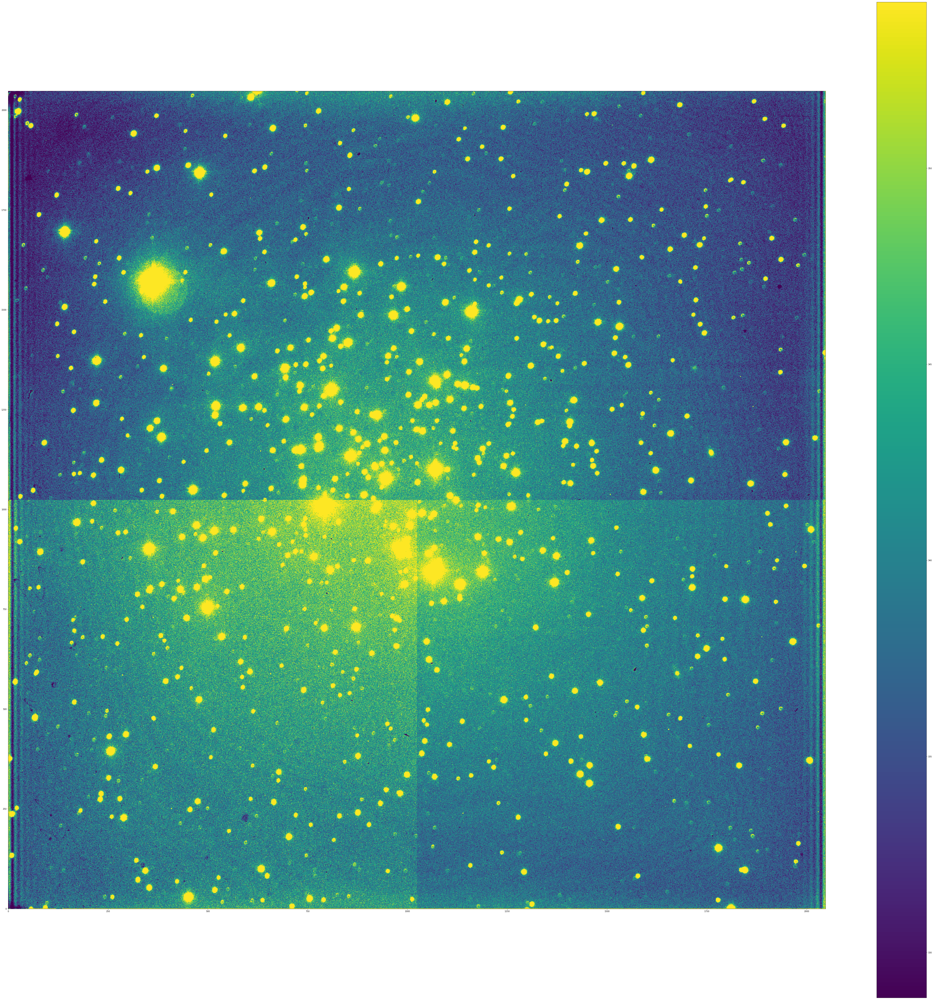

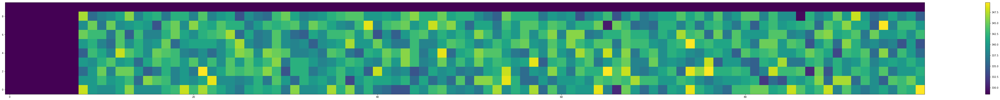

In [118]:
testfile = files_BIAS[0]
testfile = '0063.M67.fits'

HDUList = fits.open(testfile)
header = HDUList[0].header

# nx, ny = 1025, 1040
nx, ny = 1024, 1024

StitchedData = np.zeros((2*nx, 2*ny))
StitchedData[nx:nx*2,0:ny] = HDUList[2].data[:-1,8:-8]
StitchedData[0:nx,0:ny] = HDUList[4].data[:-1,8:-8]
StitchedData[nx:nx*2,ny:ny*2] = HDUList[1].data[:-1,8:-8]
StitchedData[0:nx,ny:ny*2] = HDUList[3].data[:-1,8:-8]


mean, median, std = sigma_clipped_stats(StitchedData)
    
plt.figure(figsize=(90,90))                     # set up the plot panel
plt.imshow(StitchedData, vmin = median - 2*std, vmax = median + 3*std, origin='lower')
plt.colorbar()
plt.show()

mean, median, std = sigma_clipped_stats(HDUList[1].data)
plt.figure(figsize=(90,7))                     # set up the plot panel
plt.imshow(HDUList[1].data[-10:,:100], vmin = median - 2*std, vmax = median + 3*std, origin='lower')
plt.colorbar()
plt.show()

# print(HDUList[1].data[:-1,8:-8].shape)

# HDUList[1].data[:-1,8:-8]

In [ ]:

# for i in np.arange(4):
#     data = HDUList[i+1].data
    
#     StitchedData[0:nx,0:ny] = data
    
#     mean, median, std = sigma_clipped_stats(data)
    
#     plt.figure(figsize=(90,7))                     # set up the plot panel
#     plt.imshow(data, vmin = median - 2*std, vmax = median + 3*std, origin='lower')
#     plt.colorbar()
#     plt.show()

In [73]:
print(HDUList[1].header['DATASEC'])
print(HDUList[2].header['DATASEC'])
print(HDUList[3].header['DATASEC'])
print(HDUList[4].header['DATASEC'])

[9:1032,1:1024]
[9:1032,1:1024]
[9:1032,1:1024]
[9:1032,1:1024]
